# PRELUDE

Before starting this notebook, I want you to explore the examples of commercial SAR data in data/commercial_cog. There are a few examples. There are examples of Stripmap, Sliding Spotlight, and Spotlight modes. Pay attention to how the resolution of individual structures changes between the different modes.

**QUESTION (20 pts):**
The scene 

CAPELLA_C13_SP_GEO_HH_20250601220547_20250601220630_preview

shows the immediate aftermath (same day scene acquisition) of a Ukrainian drone attack on Belaya air base in central Russia on June 01 2025. This scene is a good example of what intact vs destroyed small structures look like in commercial SAR data. Intelligence agencies reported based on this scene that 3 large and 4 smaller aircraft were destroyed. Spend a few minutes looking through this scene, and print screen 2-3 examples of destroyed aircraft, and 2-3 examples of in-tack aircraft. Upload your examples as a separate pdf with a brief description of how you made this distinction. This type of analysis is common in both intelligence and disaster response applications, as structures destroyed by wildfire/earthquakes/hurricanes/etc. will show similar features, but those tend to be very messy scenes and difficult to interperet. 

**ANSWER: Upload examples along with this notebook.**

Examples of destroyed and in-track aircraft are presented in the file _aircrafts.pdf_.

# Ship Detection in Commercial SAR Subsets

You have already explored commercial SAR scenes outside this notebook. Here you will process a prepared subset containing ships and build a simple brightness-based ship-candidate detector.

The detector identifies bright object candidates. It does not prove that an object is a ship.

This workflow is designed to get you familiar with the types of problems being addressed with commercial SAR data. There are 

## Learning objectives

By the end of this notebook, you should be able to load a SAR subset, display it, test brightness thresholds, group bright pixels into connected components, filter candidate objects, draw bounding boxes, and explain false positives.

In [1]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rasterio

from scipy.ndimage import label, find_objects, binary_closing
from matplotlib.patches import Rectangle

## 2. Read one SAR subset

We are using a commercial SAR preview COG. Pixel values are 8-bit display brightness values. We will use them for visual interpretation and simple bright-target detection, not calibrated radiometric analysis.

In [3]:
#SCENE_INDEX = 0

path = r"data/commercial_cog_subset/ship_subset.tif"

with rasterio.open(path) as src:
    arr = src.read(1)
    meta = {
        "width": src.width,
        "height": src.height,
        "count": src.count,
        "dtype": src.dtypes,
        "crs": src.crs,
        "resolution": src.res,
        "bounds": src.bounds,
        "nodata": src.nodata,
    }

print()
for k, v in meta.items():
    print(f"{k}: {v}")

print("Array shape:", arr.shape)
print("Array dtype:", arr.dtype)
print("Min/max:", np.nanmin(arr), np.nanmax(arr))

nodata = meta["nodata"] if meta["nodata"] is not None else 0
valid = np.isfinite(arr) & (arr != nodata)
print("Valid percentiles:", np.nanpercentile(arr[valid], [1, 50, 95, 99, 99.8, 99.9]))


width: 9381
height: 8141
count: 1
dtype: ('uint8',)
crs: EPSG:32618
resolution: (0.34999999999999054, 0.34999999999999054)
bounds: BoundingBox(left=579373.1451899222, bottom=4500843.217511419, right=582656.495189922, top=4503692.567511419)
nodata: 0.0
Array shape: (8141, 9381)
Array dtype: uint8
Min/max: 1 255
Valid percentiles: [  1.  22.  72.  85. 136. 158.]


## 3. Display the SAR subset

For Capella preview imagery, values may already be 8-bit display values. We use a percentile stretch and ignore nodata.

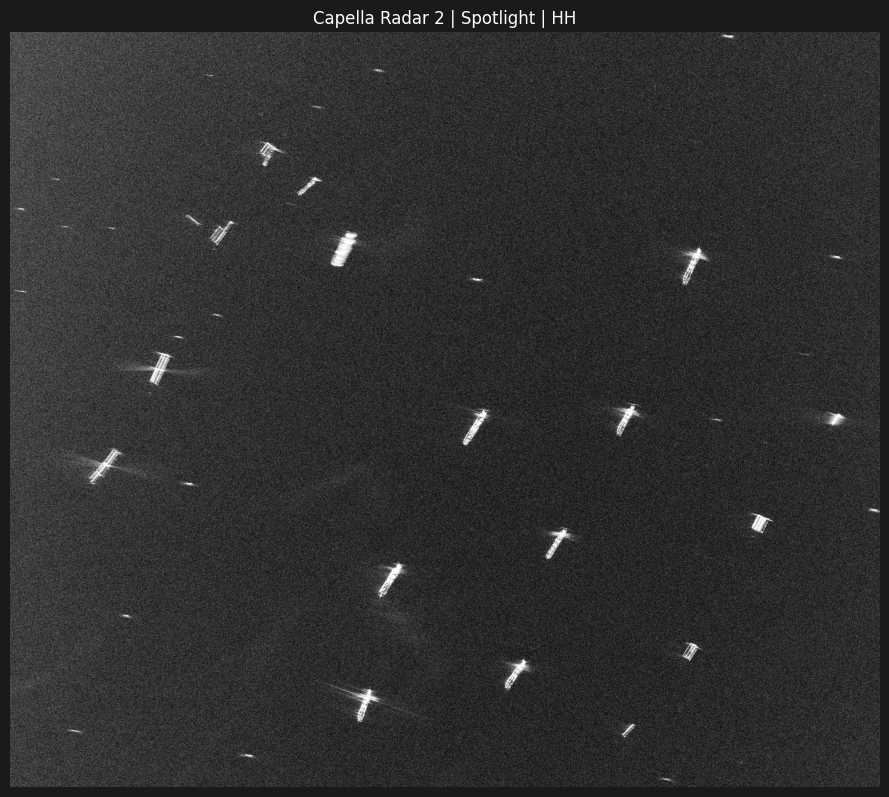

In [4]:
def display_sar(arr, pmin=1, pmax=99.8, nodata=0):
    img = arr.astype("float32").copy()
    if nodata is not None:
        img[img == nodata] = np.nan

    finite = np.isfinite(img)
    if not finite.any():
        return np.zeros_like(img, dtype="float32")

    lo, hi = np.nanpercentile(img[finite], [pmin, pmax])
    return np.clip((img - lo) / (hi - lo + 1e-9), 0, 1)


def plot_sar(arr, title="", pmin=1, pmax=99.8, nodata=0, figsize=(9, 9)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    plt.figure(figsize=figsize)
    plt.imshow(disp, cmap="gray")
    plt.title(title)
    plt.axis("off")
    plt.tight_layout()
    plt.show()


plot_sar(arr, title=f"Capella Radar 2 | Spotlight | HH", nodata=nodata)

### Questions

1. Identify several bright targets that are likely ships.
2. Do all ships appear as single blobs?
**QUESTION (5 pts):Zoom in very closely to some large ships in your GIS program. Do all ships still appear as single blobs? What might be some difficulty in designing a detector that can isolate single ships vs multiple clustered ships?**

**ANSWER:** No. Large ships often split into several bright components instead of one single blob. This makes detection difficult, because one real ship may be counted as multiple objects, while nearby clustered ships may be merged into one detection.

## 4. Test brightness thresholds

A first simple detector is: `ship candidate pixel = brightness >= threshold`.

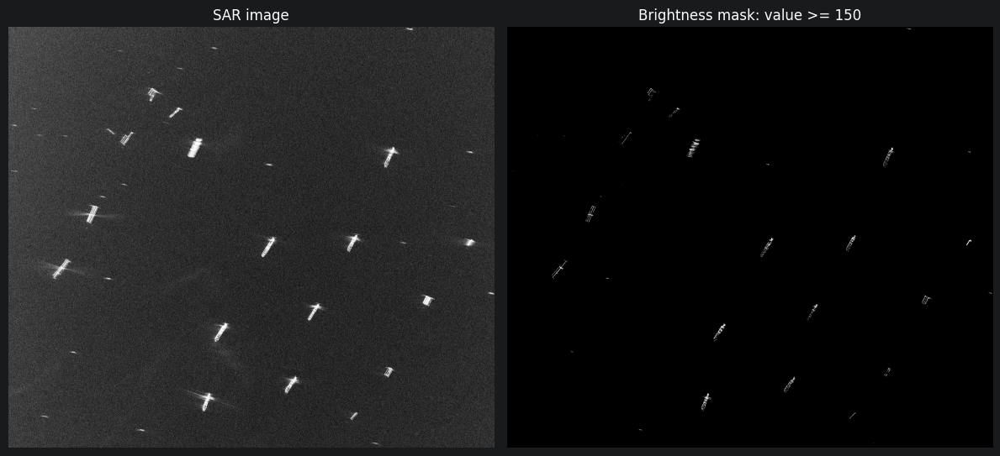

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.0013614641663524428


In [5]:
def plot_threshold_mask(arr, threshold, nodata=0, pmin=1, pmax=99.8):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata
    mask = (img >= threshold) & valid

    fig, axes = plt.subplots(1, 2, figsize=(12, 6))
    axes[0].imshow(display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata), cmap="gray")
    axes[0].set_title("SAR image")
    axes[0].axis("off")

    axes[1].imshow(mask, cmap="gray")
    axes[1].set_title(f"Brightness mask: value >= {threshold}")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

    print("Pixels above threshold:", int(mask.sum()))
    print("Fraction of valid pixels above threshold:", float(mask.sum() / valid.sum()))
    return mask


mask = plot_threshold_mask(arr, threshold=150, nodata=nodata)

The brightest ships show here, but this misses smaller ships. We will need a smaller threshold to capture as many ships as we can. Test a few different thresholds below. 


Threshold: 80


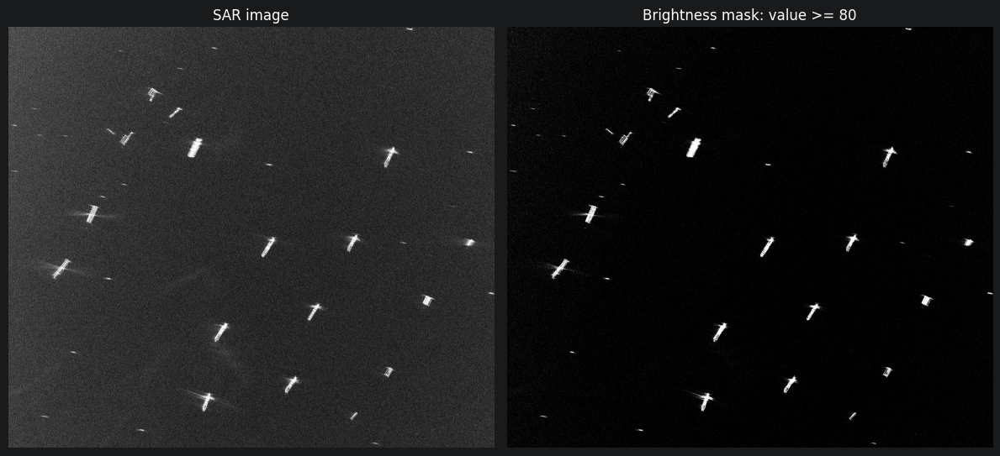

Pixels above threshold: 1437115
Fraction of valid pixels above threshold: 0.018817617290793943

Threshold: 100


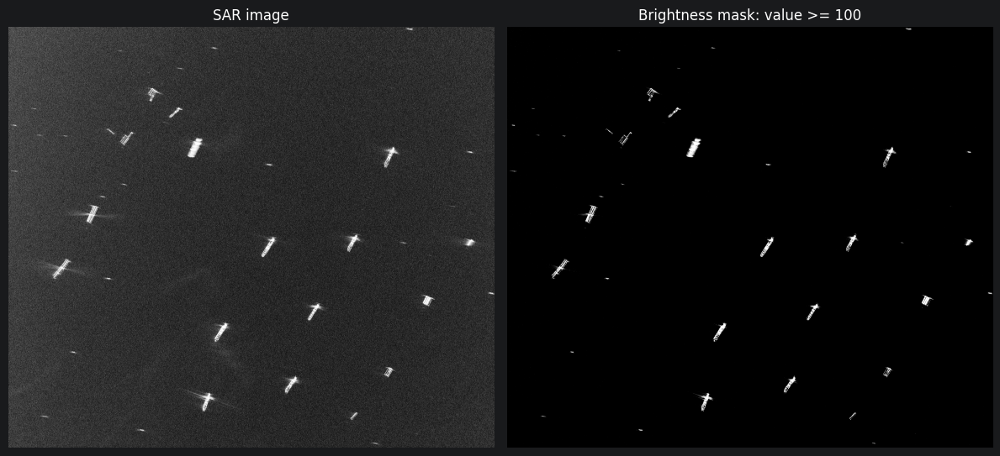

Pixels above threshold: 323454
Fraction of valid pixels above threshold: 0.004235314211581164

Threshold: 120


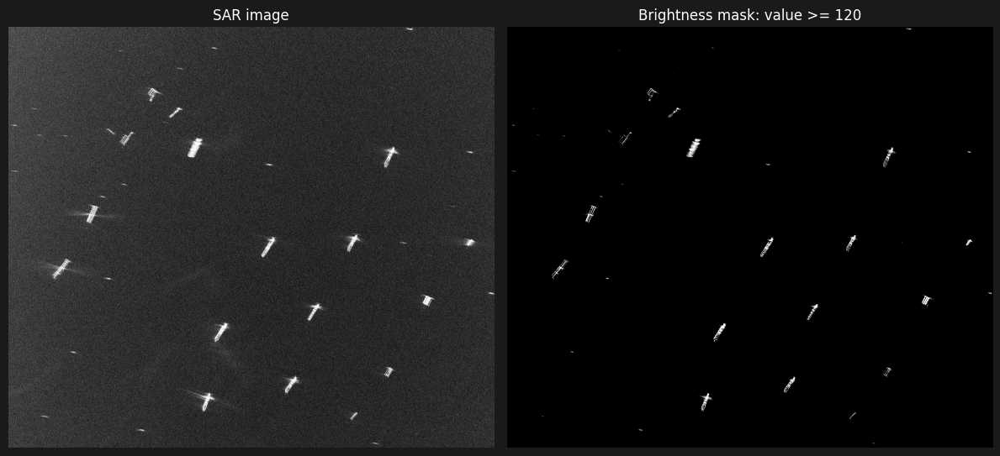

Pixels above threshold: 222481
Fraction of valid pixels above threshold: 0.0029131713971902924

Threshold: 150


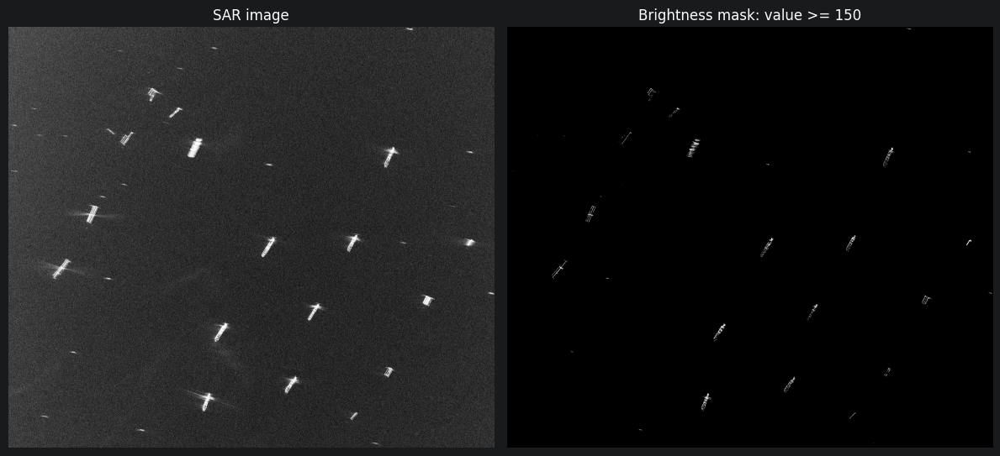

Pixels above threshold: 103976
Fraction of valid pixels above threshold: 0.0013614641663524428

Threshold: 180


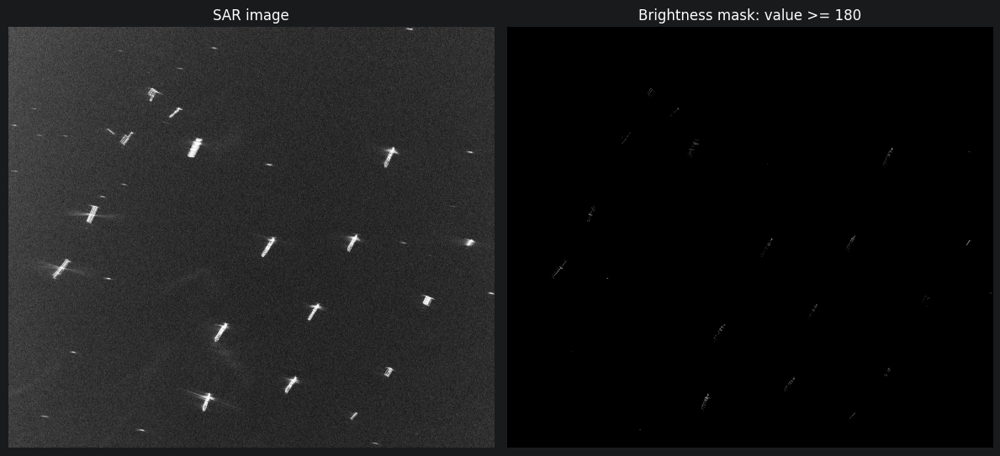

Pixels above threshold: 29482
Fraction of valid pixels above threshold: 0.0003860379948488374

Threshold: 220


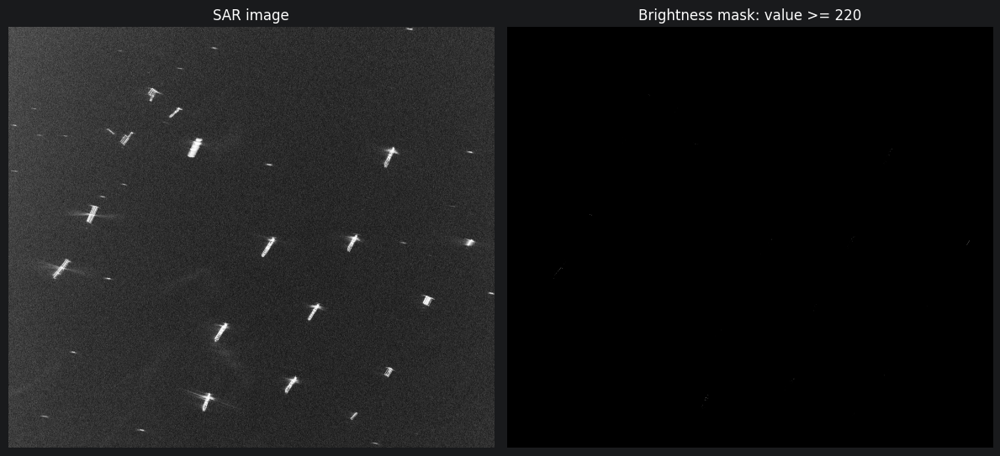

Pixels above threshold: 2005
Fraction of valid pixels above threshold: 2.6253516710939522e-05


In [6]:
###TRY SOME DIFFERENT THRESHOLDS HERE. PUT YOUR THRESHOLDS IN THE BRACKETS
for threshold in [80, 100, 120, 150, 180, 220]:
    print("\nThreshold:", threshold)
    _ = plot_threshold_mask(arr, threshold=threshold, nodata=nodata)

**QUESTION (10 pts):**
1. Which threshold seems too low?
2. Which threshold seems too high?
3. Which threshold would you choose for a first-pass detector?
4. What types of ships or ship parts might be missed by a high threshold?

**ANSWER:** A threshold of 80 is still usable, but it captures many weak bright pixels and background clutter, so it may produce more false positives. A threshold of 180 seems too high, because most ships almost disappear and only the brightest fragments remain. I would choose 150 as a first-pass detector, since it keeps most clear ship targets while removing much of the background noise. A high threshold may miss small or dim ships, ship edges, and less reflective parts of large vessels.

## 5. Connected components

The threshold mask marks bright pixels, not objects. Connected-component labeling groups adjacent bright pixels into candidate objects.

In [7]:
def connected_component_table(mask, arr):
    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    img = arr.astype("float32")
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        area = int(component.sum())
        width = x1 - x0
        height = y1 - y0
        values = img[slc][component]
        rows.append({
            "object_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "width_pix": width, "height_pix": height, "area_pix": area,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    table = pd.DataFrame(rows)
    if len(table):
        table = table.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return table, labeled


threshold = 100
img = arr.astype("float32")
valid = np.isfinite(img) & (img != nodata)
mask = (img >= threshold) & valid
component_table, labeled = connected_component_table(mask, arr)
print("Number of connected components:", len(component_table))
display(component_table.head(20))

Number of connected components: 6795


,object_id,x0,y0,x1,y1,width_pix,height_pix,area_pix,mean_brightness,max_brightness
0,3421,4887,4084,5144,4457,257,373,22088,141.993073,255.0
1,6060,3738,7084,3965,7430,227,346,21975,148.802414,255.0
2,2754,1506,3460,1753,3802,247,342,20445,137.180634,255.0
3,4100,854,4527,1188,4862,334,335,18993,139.647873,255.0
4,1887,7254,2319,7497,2721,243,402,18730,145.751892,255.0
5,3338,6541,4032,6754,4344,213,312,17282,145.257782,255.0
6,3537,8842,4121,8992,4246,150,125,8066,140.005203,255.0
7,695,2700,1197,2922,1349,222,152,6500,143.544159,255.0
8,5752,5335,6768,5571,7075,236,307,16751,144.014740,252.0
9,4673,879,4869,914,4882,35,13,228,151.679825,251.0


**QUESTION (5 pts): Look at the number of connected components, printed before the table. Does that match with the approximate number of ships you think you should see? NOTE: The above and below cells only plot connected components and bounding boxes for a small subset of what was found. You can play with these values, but the image might get hard to read.**

**ANSWER:** No. 6795 connected components is far too high compared to the approximate number of visible ships. Many components come from noise.

## 6. Plot bounding boxes

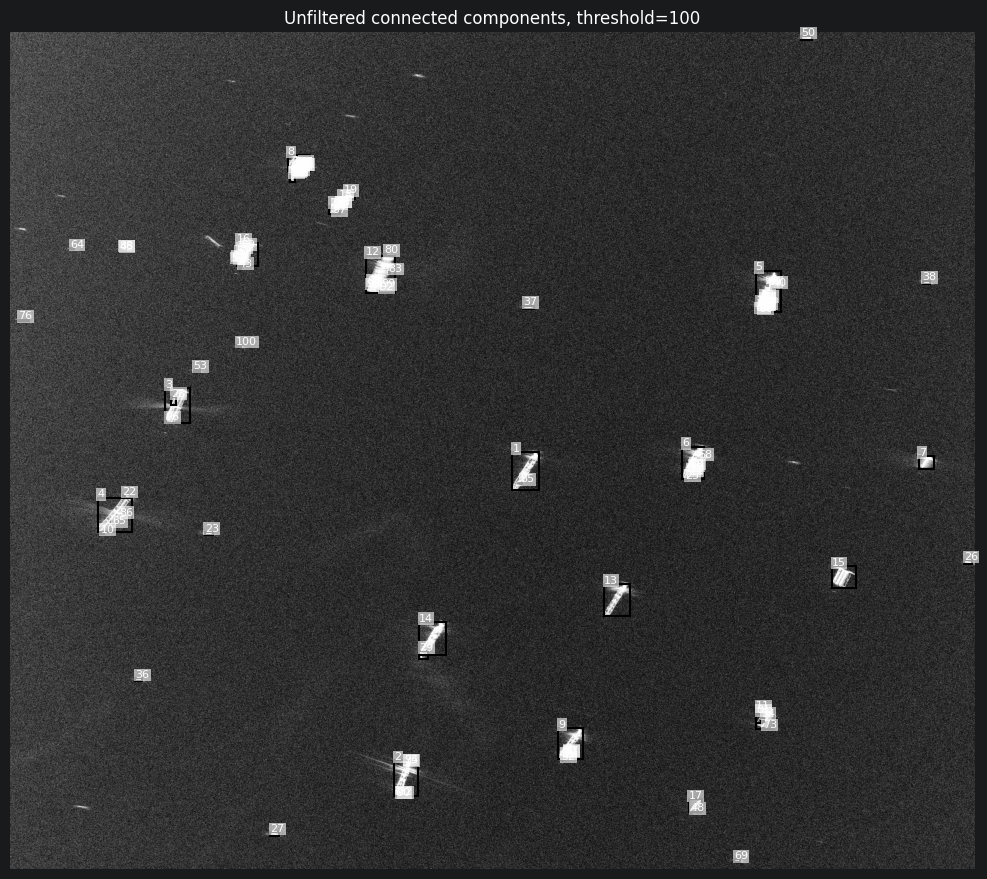

In [8]:
def plot_boxes(arr, candidates, title="Candidate boxes", nodata=0, pmin=1, pmax=99.8, max_boxes=100, label_boxes=True,
               figsize=(10, 10)):
    disp = display_sar(arr, pmin=pmin, pmax=pmax, nodata=nodata)
    fig, ax = plt.subplots(figsize=figsize)
    ax.imshow(disp, cmap="gray")
    ax.set_title(title)

    for i, (_, r) in enumerate(candidates.head(max_boxes).iterrows(), start=1):
        rect = Rectangle((r["x0"], r["y0"]), r["x1"] - r["x0"], r["y1"] - r["y0"], fill=False, linewidth=1.5)
        ax.add_patch(rect)
        if label_boxes:
            ax.text(r["x0"], max(r["y0"] - 3, 0), str(i), fontsize=8,
                    bbox=dict(facecolor="white", alpha=0.6, edgecolor="none", pad=1))

    ax.axis("off")
    plt.tight_layout()
    plt.show()


plot_boxes(arr, component_table.head(100), title=f"Unfiltered connected components, threshold={threshold}",
           nodata=nodata)

## 7. Precompiled reference detector

Use this to experiment with parameters before completing your own final detector.

In [9]:
def detect_ship_candidates_precompiled(arr, threshold=100, nodata=0, min_area=4, max_area=500, max_width=120,
                                       max_height=120, min_aspect=0.1, max_aspect=10.0, do_closing=True):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    mask = (img >= threshold) & valid
    if do_closing:
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc
        component = labeled[slc] == object_id
        area = int(component.sum())
        if area < min_area or area > max_area:
            continue

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        values = img[slc][component]
        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width, "height_pix": height, "area_pix": area, "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    candidates = pd.DataFrame(rows)
    if len(candidates):
        candidates = candidates.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled

Detected candidates: 1284


,candidate_id,x0,y0,x1,y1,center_x,center_y,width_pix,height_pix,area_pix,aspect,mean_brightness,max_brightness
0,3767,879,4869,914,4882,896.5,4875.5,35,13,246,2.692308,146.544708,251.0
1,1995,7303,2618,7344,2684,7323.5,2651.0,41,66,473,0.621212,139.439743,215.0
2,3237,6570,4345,6585,4359,6577.5,4352.0,15,14,134,1.071429,147.029846,212.0
3,2036,7306,2671,7316,2678,7311.0,2674.5,10,7,46,1.428571,142.826080,208.0
4,5206,3777,7426,3795,7437,3786.0,7431.5,18,11,142,1.636364,144.887329,205.0
5,1982,7303,2590,7309,2599,7306.0,2594.5,6,9,35,0.666667,153.600006,205.0
6,4532,7305,6659,7337,6709,7321.0,6684.0,32,50,375,0.640000,133.664001,204.0
7,2077,7285,2724,7297,2733,7291.0,2728.5,12,9,83,1.333333,151.277115,197.0
8,4809,5390,7032,5404,7043,5397.0,7037.5,14,11,66,1.272727,141.515152,196.0
9,859,2765,1370,2790,1391,2777.5,1380.5,25,21,179,1.190476,134.290497,195.0


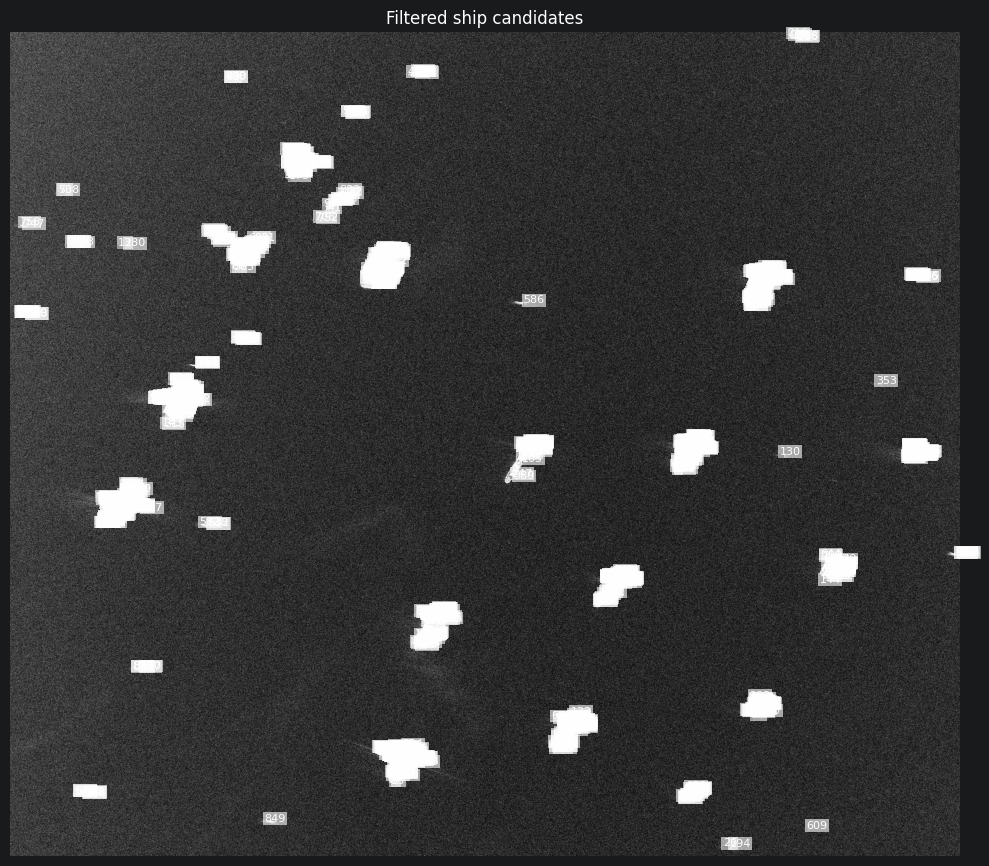

In [10]:
test_candidates, test_mask, test_labeled = detect_ship_candidates_precompiled(arr, threshold=100, nodata=nodata,
                                                                              min_area=4, max_area=500, max_width=120,
                                                                              max_height=120, do_closing=True)
print("Detected candidates:", len(test_candidates))
display(test_candidates.head(30))
plot_boxes(arr, test_candidates, title="Filtered ship candidates", nodata=nodata, max_boxes=1000)

The cell below will allow you to test a few different thresholds and areas at the same time. NOTE: If processing is too slow on your laptop, you can always take a smaller subset from QGIS for testing.


Settings: {'threshold': 80, 'min_area': 3, 'max_area': 800}
Candidate count: 117672


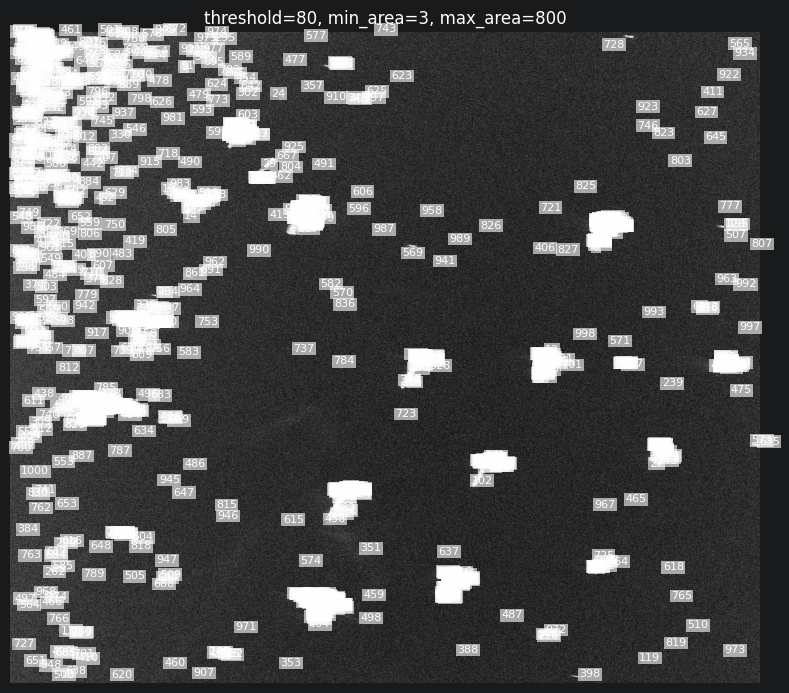


Settings: {'threshold': 100, 'min_area': 4, 'max_area': 500}
Candidate count: 1284


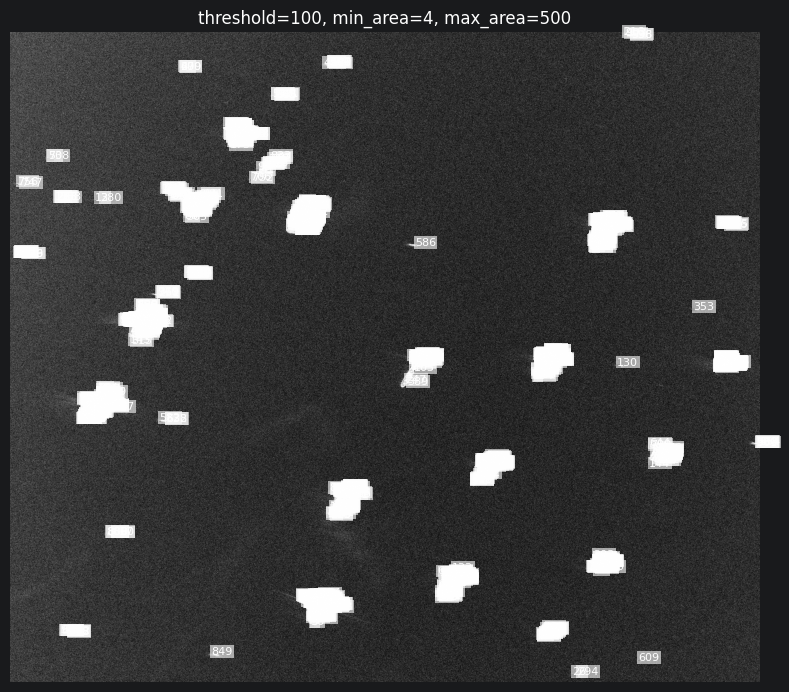


Settings: {'threshold': 120, 'min_area': 8, 'max_area': 700}
Candidate count: 553


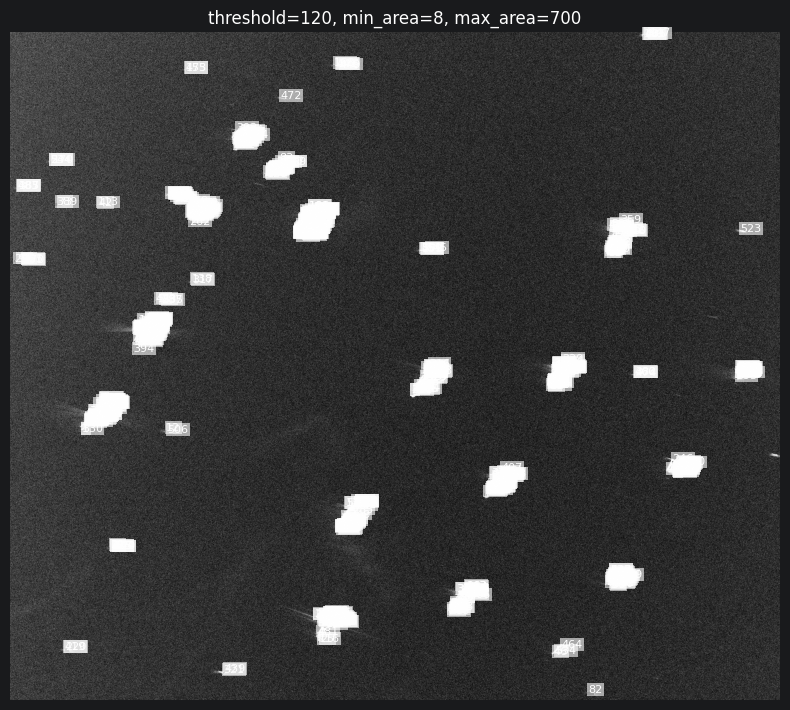


Settings: {'threshold': 140, 'min_area': 10, 'max_area': 1000}
Candidate count: 541


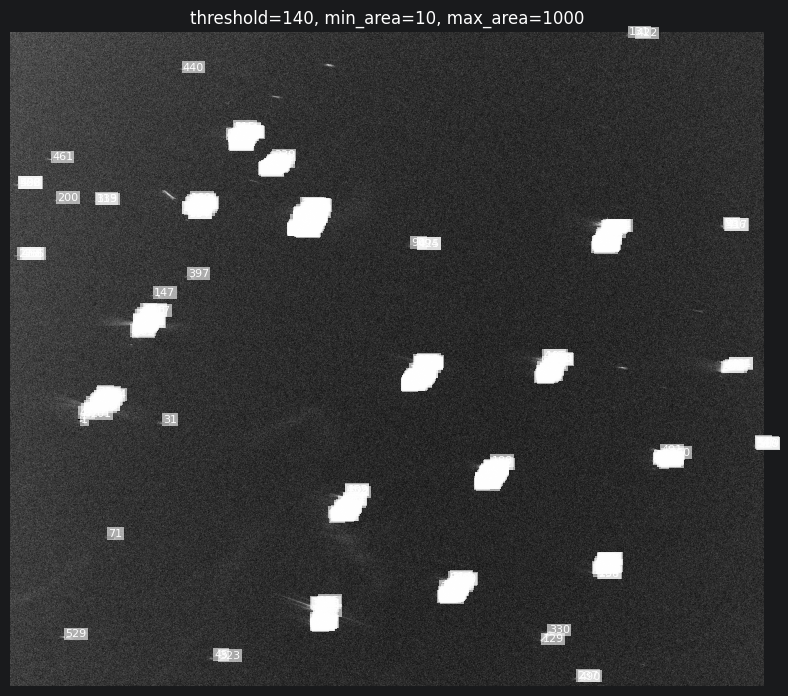


Settings: {'threshold': 160, 'min_area': 15, 'max_area': 1200}
Candidate count: 501


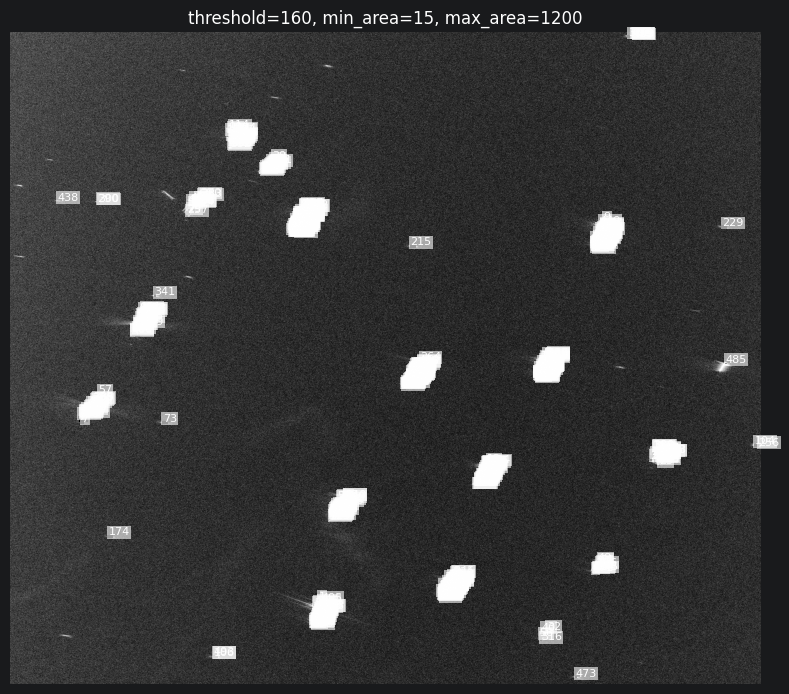

In [12]:
settings = [
    {"threshold": 80, "min_area": 3, "max_area": 800},
    {"threshold": 100, "min_area": 4, "max_area": 500},
    {"threshold": 120, "min_area": 8, "max_area": 700},
    {"threshold": 140, "min_area": 10, "max_area": 1000},
    {"threshold": 160, "min_area": 15, "max_area": 1200},
]

for s in settings:
    candidates, _, _ = detect_ship_candidates_precompiled(arr, nodata=nodata, max_width=120, max_height=120,
                                                          do_closing=True, **s)
    print("\nSettings:", s)
    print("Candidate count:", len(candidates))
    plot_boxes(arr, candidates, title=f"threshold={s['threshold']}, min_area={s['min_area']}, max_area={s['max_area']}",
               nodata=nodata, max_boxes=1000, figsize=(8, 8))

**QUESTION (10 pts):**
1. Which settings produce too many false positives?
2. Which settings miss obvious ships?
3. Do larger ships split into multiple components?

**ANSWER:** The setting with threshold=80, min_area=3, max_area=800 produces too many false positives, because it detects a large number of weak bright pixels. The threshold=100 setting is better, but still gives many detections. Higher thresholds such as 160 are more restrictive and may miss dimmer ships or weaker parts of ships. Larger ships often split into multiple components, because one vessel can appear as several separated bright reflections in the SAR image.

# 8. Final coding exercise ﷿﷿﷿ finish the ship detector

**QUESTION (30 pts):**
Adjust the detect_ship_candidates_precompiled() function above to group these candidate detections into individual ships. Right now, single ships are clusters of several to many different individual pieces - this is expected becasue SAR images of individual structures like boats are not uniformly illuminated, meaning there will often be gaps in bright spots. I found the scipy package binary_dilation to be very useful to add here. You will need to adjust the binary_closing if statement to first do binary_dilation, while also getting the structure correct with the merge_distance_pix variable. When compiling the summary statistics table at the end, it will be important to use the original bright pixels inside your grouped boxes to compute brightness, not the dilated pixels. The following code block will help with that:

        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid


In [13]:
from scipy.ndimage import binary_dilation


def detect_ship_candidates_grouped(
        arr,
        threshold=100,
        nodata=0,
        min_area=4,
        max_area=50000,
        max_width=600,
        max_height=600,
        min_aspect=0.05,
        max_aspect=30.0,
        merge_distance_pix=15,
        do_closing=True,
):
    img = arr.astype("float32")
    valid = np.isfinite(img)
    if nodata is not None:
        valid &= img != nodata

    original_mask = (img >= threshold) & valid
    mask = original_mask.copy()

    if do_closing:
        merge_distance_pix = max(int(merge_distance_pix), 0)
        if merge_distance_pix > 0:
            yy, xx = np.ogrid[-merge_distance_pix:merge_distance_pix + 1, -merge_distance_pix:merge_distance_pix + 1]
            merge_structure = (xx * xx + yy * yy) <= merge_distance_pix * merge_distance_pix
            mask = binary_dilation(mask, structure=merge_structure)
        mask = binary_closing(mask, structure=np.ones((2, 2)))

    labeled, n_labels = label(mask)
    objects = find_objects(labeled)
    rows = []

    for object_id, slc in enumerate(objects, start=1):
        if slc is None:
            continue
        rr, cc = slc

        y0, y1 = rr.start, rr.stop
        x0, x1 = cc.start, cc.stop
        width = x1 - x0
        height = y1 - y0
        aspect = width / max(height, 1)

        if width > max_width or height > max_height:
            continue
        if aspect < min_aspect or aspect > max_aspect:
            continue

        original_component_pixels = img[y0:y1, x0:x1]
        original_valid = valid[y0:y1, x0:x1]
        original_bright = (original_component_pixels >= threshold) & original_valid
        area = int(original_bright.sum())

        if area < min_area or area > max_area:
            continue

        values = original_component_pixels[original_bright]
        rows.append({
            "candidate_id": object_id,
            "x0": x0, "y0": y0, "x1": x1, "y1": y1,
            "center_x": 0.5 * (x0 + x1),
            "center_y": 0.5 * (y0 + y1),
            "width_pix": width, "height_pix": height, "area_pix": area, "aspect": aspect,
            "mean_brightness": float(np.nanmean(values)),
            "max_brightness": float(np.nanmax(values)),
        })

    columns = [
        "candidate_id",
        "x0", "y0", "x1", "y1",
        "center_x", "center_y",
        "width_pix", "height_pix", "area_pix", "aspect",
        "mean_brightness", "max_brightness",
    ]
    candidates = pd.DataFrame(rows, columns=columns)
    if len(candidates):
        candidates = candidates.sort_values(["max_brightness", "area_pix"], ascending=False).reset_index(drop=True)
    return candidates, mask, labeled


The following cells run and plot the above function.

candidate rows: 36
 candidate_id   x0   y0   x1   y1  center_x  center_y  width_pix  height_pix  area_pix   aspect  mean_brightness  max_brightness
           34 3686 7070 3973 7456    3829.5    7263.0        287         386     12748 0.743523       170.230545           255.0
           23 4868 4056 5162 4476    5015.0    4266.0        294         420     11313 0.700000       162.587021           255.0
           14 7234 2301 7520 2752    7377.0    2526.5        286         451     10716 0.634146       166.791153           255.0
           22 6521 3995 6787 4378    6654.0    4186.5        266         383      9602 0.694517       166.321075           255.0
           21 1490 3444 1767 3823    1628.5    3633.5        277         379      8578 0.730871       165.512360           255.0
           25  838 4476 1214 4900    1026.0    4688.0        376         424      7731 0.886792       174.177719           255.0
            4 2682 1179 2932 1467    2807.0    1323.0        250         288  

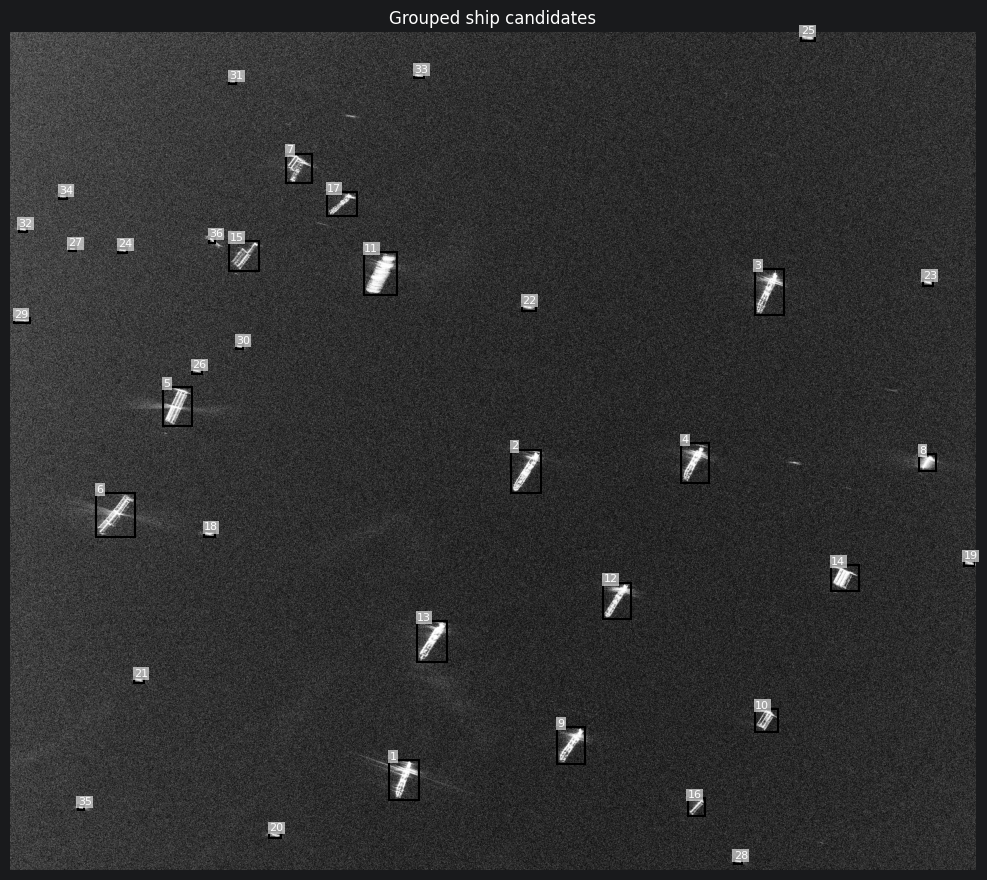

In [15]:
candidates, mask, labeled = detect_ship_candidates_grouped(
    arr,
    threshold=140,
    nodata=0,
    min_area=20,
    max_area=70000,
    max_width=700,
    max_height=700,
    merge_distance_pix=20,
)
print("candidate rows:", len(candidates))
print(candidates.head(30).to_string(index=False))

plot_boxes(
    arr,
    candidates,
    title="Grouped ship candidates",
    nodata=0,
    max_boxes=1000,
)

## 9. Short interpretation note
**QUESTION (20 pts):**
Write 1 paragraph describing which parameters you settled on and why.

- Which threshold and size filters did you choose?
- Did your detector mostly find ships, or did it also detect clutter?
- What false positives remain? What false negatives remain?
- What types of ships might be missed?

**ANSWER:** ANSWER: I settled on a threshold of 140 with `min_area=20`, `max_area=70000`, `max_width=700`, `max_height=700`, and `merge_distance_pix=20`. This threshold is a compromise between the lower values, which produced too many false positives from weak bright pixels and clutter, and higher values, which started to remove dimmer ships or weaker ship parts. The dilation-based grouping helps merge separated bright reflections from the same large ship, so the detector mostly finds likely ships rather than individual ship fragments. However, some false positives still remain, mainly from bright speckle, clutter, and SAR artifacts, while false negatives may include very small ships, or ships that are too close together and become merged into a single detection.

